# Applied Data Science Capstone Project
**Done By: Arvind Subramanian**

# Real Estate Assistance for Buyers in the Greater Toronto Area

## Introduction

Buying your own house can be one of the most financially important decisions of your life. This project aims to advise buyers on where to find property in the Greater Toronto Area (GTA) with the best value for their money. It will also factor in important considerations on each neighborhood, some of which may not be immediately apparent to buyers. These considerations include:

- Neighborhood Average Real-Estate Prices
- House Type
- Floor Area
- Configuration
- Neighborhood Median Income
- Proximity to City-Center
- Most Common Venues
- Crime Rate
- Fire Safety

We will examine each of these considerations in depth.

Thereafter, the correlation between the various considerations and the price will be evaluated using various models and real-world data:

- Price Modeling

The most suitable model will then be chosen to design a price calculator for buyers to estimate the price of their dream home in the GTA.

- Price Calculator

In [1]:
# Install Relevant Modules

!conda install -c anaconda beautifulsoup4 --yes
!conda install -c anaconda lxml --yes
%pip install geocoder

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Import Required Libraries

import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup
import geocoder
import folium
from folium import plugins
from folium.plugins import HeatMap
import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
from math import sin, cos, sqrt, atan2, radians

## Neighborhood Average Real-Estate Prices

Analyze the price distribution of real-estate across the GTA. Price per square foot (P/SQFT) is utilized to minimize the impact of discrepancies caused by house type, size and other potential factors.

In [3]:
# Read in the GTA real-estate sales data obtained from Zoocasa. Courtesy of slavaspirin (https://github.com/slavaspirin/Toronto-housing-price-prediction)

red = pd.read_csv(r'houses_edited.csv')

# The dataset is huge. 1000 listings should provide a good enough sample size for this demonstration.
# Clean up the data. 

red.dropna(subset=['sqft'], axis=0, inplace=True)
beds=[]
for index, row in red.iterrows():
    beds.append(eval(row['bedrooms']))
red['beds']=beds
red.drop(['bedrooms'], axis=1, inplace=True)
red.rename(columns={'bathrooms': 'baths'}, inplace=True)
red['cdc']=red['city_district'].astype(str)+' ('+red['district_code'].astype(str)+')'
red['ppsqft']=round(red['final_price']/red['sqft'])
red.drop(['index','title','full_address','description','final_price_transformed','final_price_log','bedrooms_ag','bedrooms_bg','mls','list_price','full_link','city_district','district_code'], axis=1, inplace=True)

In [4]:
# Obtain the distance of the various listings from city-center of Toronto using a trigonometric formula. Add it to the original df.

redist = red[['lat','long','ppsqft','sqft']]
redist['distcc'] = redist['ppsqft']
lat1 = radians(43.6532)
lon1 = radians(-79.3832) # Coords of Toronto city-center.
R = 6373.0 # Earth's radius in km.

for index, row in redist.iterrows():
    lat2 = radians(row['lat'])
    lon2 = radians(row['long'])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    dist = R*c
    row['distcc'] = dist

red['distcc'] = redist['distcc']

retest = red.iloc[1001:2001,:] # Set aside another slice of the data for real-world testing later on.
redata = red.iloc[0:1000,:]
retest.reset_index(drop=True, inplace=True)
redata.reset_index(drop=True, inplace=True)
redata.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,final_price,baths,sqft,parking,type,lat,long,mean_district_income,beds,cdc,ppsqft,distcc
0,855000,2,850.0,1,Condo Apt,43.661896,-79.385748,56526,3,Bay Street Corridor (76),1006.0,0.988704
1,550000,1,550.0,0,Condo Apt,43.708472,-79.397498,57039,1,Mount Pleasant West (104),1000.0,6.254562
2,665000,1,650.0,1,Condo Apt,43.638399,-79.414448,70623,2,Niagara (82),1023.0,3.005997
3,368000,1,250.0,1,Condo Apt,43.601518,-79.510062,44101,0,New Toronto (18),1472.0,11.720599
4,2700000,5,2750.0,2,Detached,43.714068,-79.403338,169203,4,Lawrence Park South (103),982.0,6.961444


Plot the data onto a Chloropleth Map of the GTA.

In [5]:
# Represent the real-estate prices for the various neighborhoods on a chloropleth map.

!wget --quiet https://github.com/jasonicarter/toronto-geojson/raw/master/toronto_crs84.geojson -O toronto_gj.json
tor_geo = r'toronto_gj.json'

toronto_map = folium.Map(location=[43.7032, -79.3832], zoom_start=12)

toronto_map.choropleth(
    geo_data=tor_geo,
    data=redata,
    columns=['cdc', 'ppsqft'],
    key_on='feature.properties.AREA_NAME',
    fill_color='PuBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Real Estate Price per SqFt Range in the Greater Toronto Area'
)

# We will now plot all the listings from our dataset onto the chloropleth map.

houses = plugins.MarkerCluster().add_to(toronto_map)

for lat, lng, bed, bath, sqft, typ, price in zip(redata.lat, redata.long, redata.beds, redata.baths, redata.sqft, redata.type, redata.final_price):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup= (str(bed)+' Bed, '+str(bath)+' Bath, '+str(sqft)+'sqft '+str(typ)+': '+str(price))
    ).add_to(houses)

toronto_map

Buyers now have a bird's eye view of real-estate sale prices across the GTA. This will give them a rough idea of the P/SQFT to expect in each neighborhood.

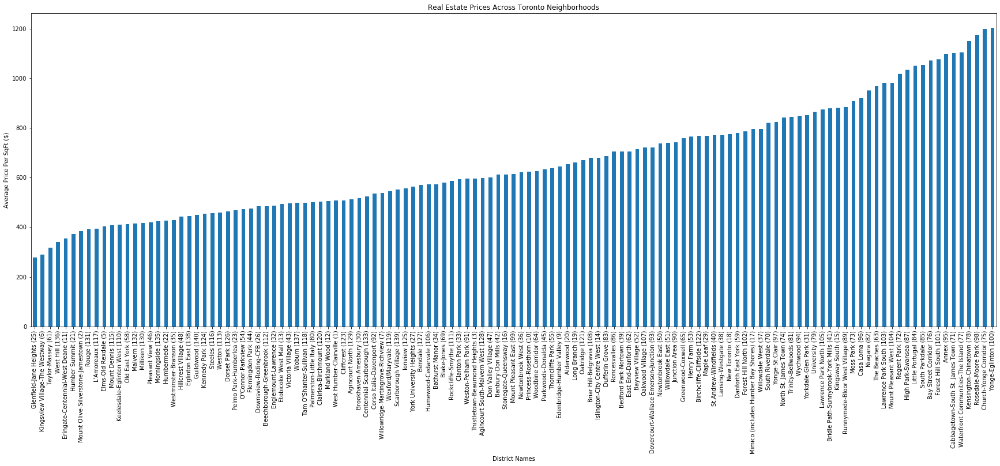

In [6]:
price_dist = redata[['cdc','ppsqft']].groupby(['cdc'], as_index=True).mean()
price_dist.sort_values(by='ppsqft', ascending=True, inplace=True)

price_dist.plot(kind='bar', figsize=(30, 10), legend=None)
plt.xlabel('District Names')
plt.ylabel('Average Price Per SqFt ($)')
plt.title('Real Estate Prices Across Toronto Neighborhoods')

plt.show()

This bar chart provides a more quantifiable view of the real-estate prices and allows buyers to pinpoint similarly priced neighborhoods.

Now that we have observed the price  trends, let us examine some typical considerations of buyers and how they affect the prices.

## House Type

View the types of houses available to buyers in the GTA and their P/SQFT ranges.

In [7]:
condos = redata[['cdc','type','ppsqft']]
thouse = redata[['cdc','type','ppsqft']]
det = redata[['cdc','type','ppsqft']]
semid = redata[['cdc','type','ppsqft']]
plex = redata[['cdc','type','ppsqft']]
att = redata[['cdc','type','ppsqft']]
cele = redata[['cdc','type','ppsqft']]

for index, row in condos.iterrows():
    if row['type'] != 'Condo Apt':
        condos.drop(index, inplace=True)
for index, row in thouse.iterrows():
    if row['type'] != 'Condo Townhouse':
        thouse.drop(index, inplace=True)
for index, row in det.iterrows():
    if row['type'] != 'Detached':
        det.drop(index, inplace=True)
for index, row in semid.iterrows():
    if row['type'] != 'Semi-Detached':
        semid.drop(index, inplace=True)
for index, row in plex.iterrows():
    if row['type'] != 'Plex':
        plex.drop(index, inplace=True)
for index, row in att.iterrows():
    if row['type'] != 'Att/Row/Twnhouse':
        att.drop(index, inplace=True)
for index, row in cele.iterrows():
    if row['type'] != 'Comm Element Condo':
        cele.drop(index, inplace=True)

boxchart = pd.concat([condos,thouse,det,semid,plex,att,cele])

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


Text(0.5, 1.0, 'Real Estate Prices for Different House Types')

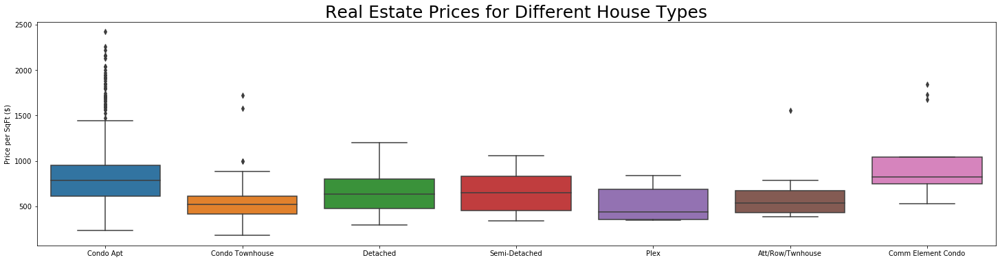

In [8]:
plt.figure(figsize=(25, 6))
ax=sns.boxplot(x=boxchart['type'], y=boxchart['ppsqft'])
ax.set(ylabel='Price per SqFt ($)')
ax.set(xlabel='')
ax.set_title("Real Estate Prices for Different House Types", fontsize='25')

Buyers now have an estimate of the median prices of the various house types across the GTA and their degree of variance with neighborhood.

## Floor Area

Examine the correlation between price and floor area.

In [9]:
reconfig = redata[['beds','baths','sqft','final_price','ppsqft']]
reconfig.sort_values(['beds','baths'], inplace=True)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,final_price,sqft
final_price,1.000000,0.759203
sqft,0.759203,1.000000


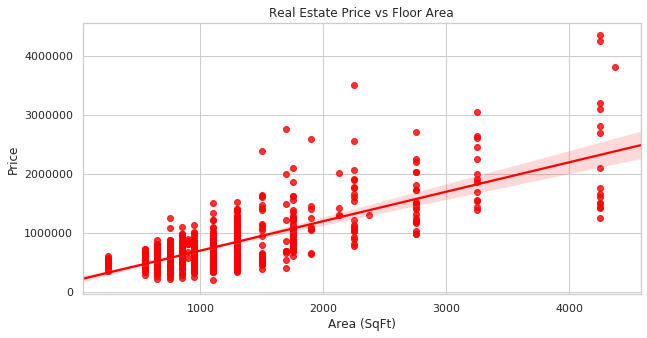

In [10]:
plt.figure(figsize=(10, 5))
sns.set(font_scale=1)
sns.set_style('whitegrid')

ax = sns.regplot(x='sqft', y='final_price', data=reconfig, color='red')
ax.set(xlabel='Area (SqFt)', ylabel='Price')
ax.set_title('Real Estate Price vs Floor Area')

reconfig[['final_price','sqft']].corr()

We can observe a good correlation between price and area of the houses (0.77). Therefore, size is likely to have the biggest impact on price across all neighborhoods.

## Configuration

Examine the correlation between price and house configuration (i.e. number of bedrooms and bathrooms).

,ppsqft,beds
ppsqft,1.00000,-0.45322
beds,-0.45322,1.00000


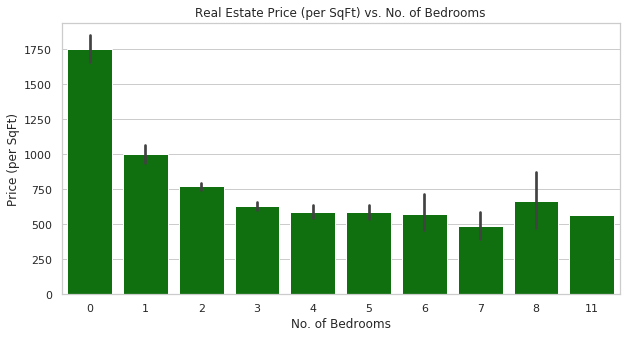

In [11]:
plt.figure(figsize=(10, 5))
sns.set(font_scale=1)
sns.set_style('whitegrid')

ax = sns.barplot(x='beds', y='ppsqft', data=reconfig, color='green')
ax.set(xlabel='No. of Bedrooms', ylabel='Price (per SqFt)')
ax.set_title('Real Estate Price (per SqFt) vs. No. of Bedrooms')

reconfig[['ppsqft','beds']].corr()

This indicates that houses become more 'worth the money' with more bedrooms, up till 3.

,ppsqft,baths
ppsqft,1.000000,-0.291102
baths,-0.291102,1.000000


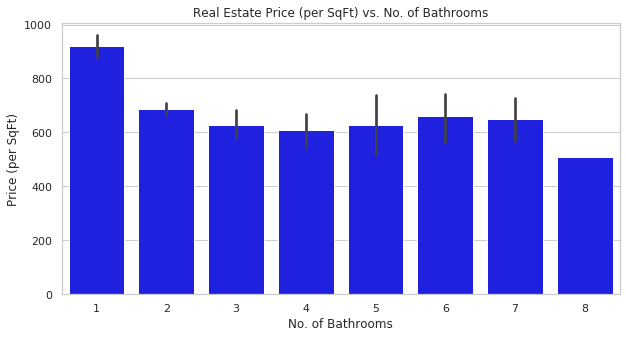

In [12]:
plt.figure(figsize=(10, 5))
sns.set(font_scale=1)
sns.set_style('whitegrid')

ax = sns.barplot(x='baths', y='ppsqft', data=reconfig, color='blue')
ax.set(xlabel='No. of Bathrooms', ylabel='Price (per SqFt)')
ax.set_title('Real Estate Price (per SqFt) vs. No. of Bathrooms')

reconfig[['ppsqft','baths']].corr()

This indicates that houses become slightly more 'worth the money' with more bedrooms, up till 4.

The last 2 graphs combined suggest that a 4 Bed, 4 Bath home would provide the best P/SQFT or value for money.

## Neighborhood Median Income

Provide an estimate of the socio-economic levels of the neighborhood and its residents.

,ppsqft,mean_district_income
ppsqft,1.000000,0.329119
mean_district_income,0.329119,1.000000


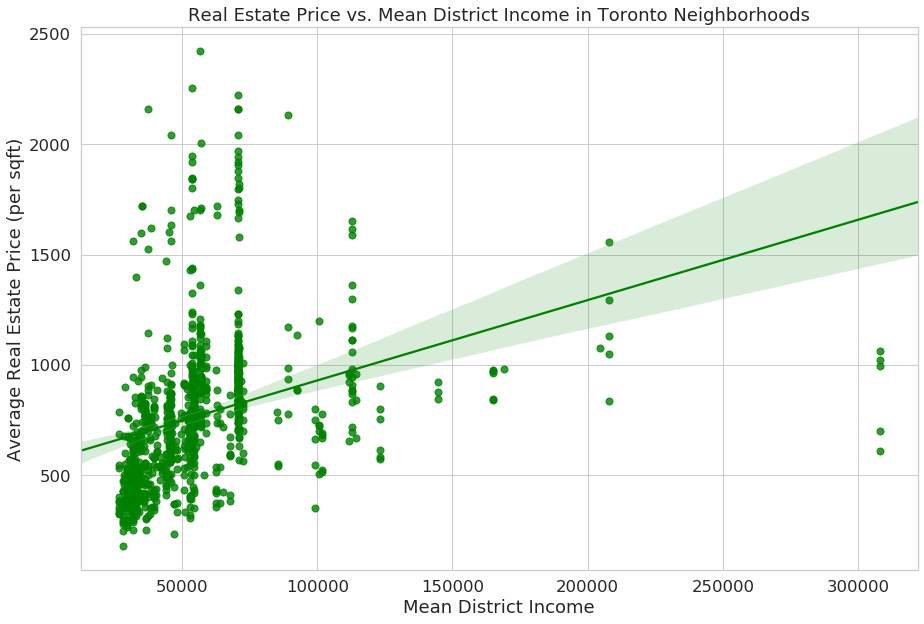

In [13]:
plt.figure(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='mean_district_income', y='ppsqft', data=redata, color='green', marker='.', scatter_kws={'s': 200})
ax.set(xlabel='Mean District Income', ylabel='Average Real Estate Price (per sqft)')
ax.set_title('Real Estate Price vs. Mean District Income in Toronto Neighborhoods')

redata[['ppsqft','mean_district_income']].corr()

The correlation between mean district income and real-estate prices is positive but poor (0.33).

## Proximity to City-Center

This is to assess if the proximity to the city-center affects the price significantly.

,ppsqft,distcc
ppsqft,1.000000,-0.643094
distcc,-0.643094,1.000000


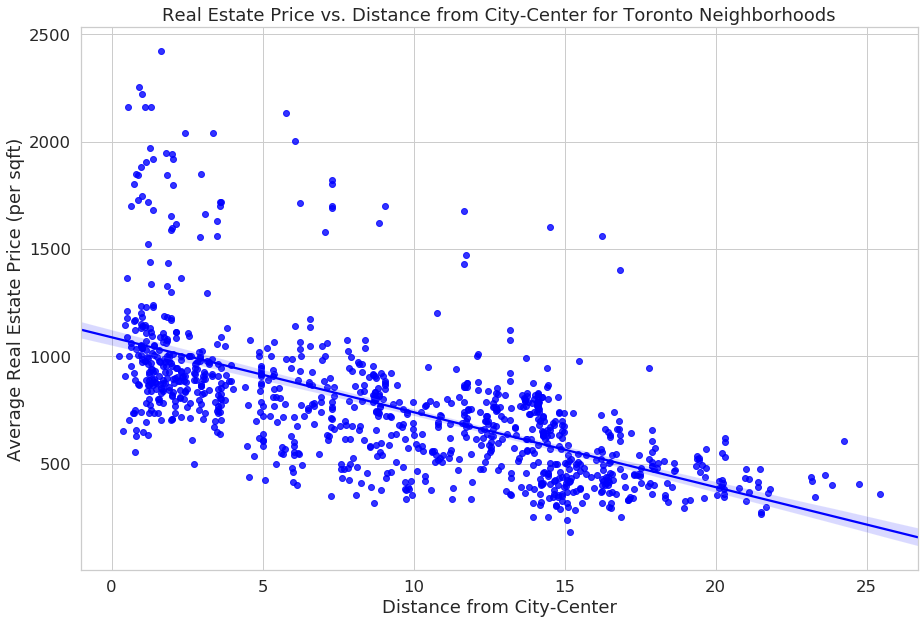

In [14]:
# Plot the price against the distance from city-center.

plt.figure(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='distcc', y='ppsqft', data=redata, color='blue')
ax.set(xlabel='Distance from City-Center', ylabel='Average Real Estate Price (per sqft)')
ax.set_title('Real Estate Price vs. Distance from City-Center for Toronto Neighborhoods')

redist[['ppsqft','distcc']].corr()

,sqft,distcc
sqft,1.000000,0.207599
distcc,0.207599,1.000000


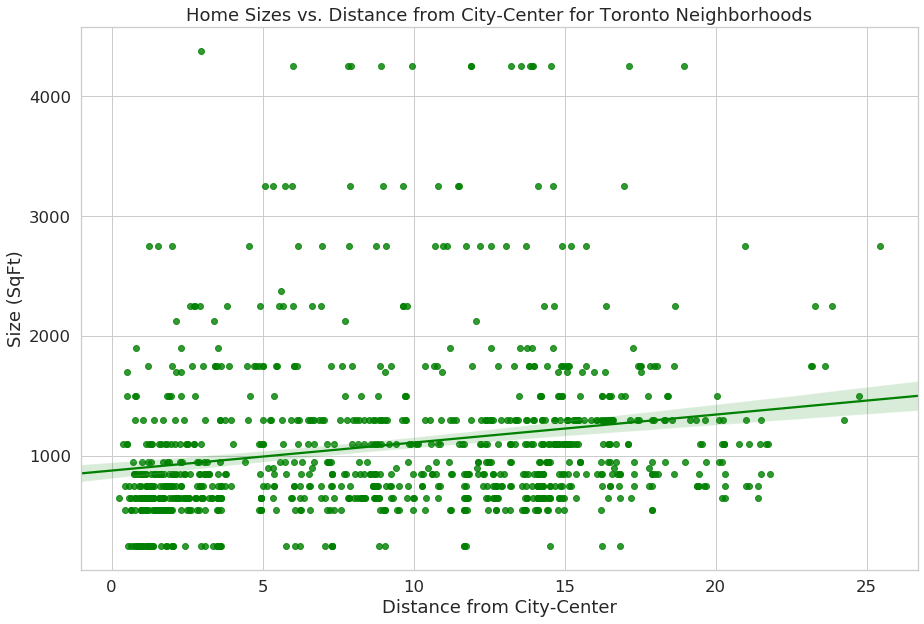

In [15]:
# Plot the size against the distance from city-center.

plt.figure(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='distcc', y='sqft', data=redata, color='green')
ax.set(xlabel='Distance from City-Center', ylabel='Size (SqFt)')
ax.set_title('Home Sizes vs. Distance from City-Center for Toronto Neighborhoods')

redist[['sqft','distcc']].corr()

The results indicate a moderate correlation between proximity to the city-center and real-estate prices (-0.60). The size of houses also does not seem to be greatly affected by proximity to the city-center, contrary to popular belief.

Based on this information, we can conclude that if Buyers were to prefer living near the city-center, they do not need to sacrifice much space but will need to pay a moderate premium.

## Most Common Venues

Provide an overview of the most common amenities within each neighborhood.

In [16]:
# Import webpage data of GTA postal codes using requests and scrape through it using BeautifulSoup to find the desired table

data = requests.get("https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M")
soup = BeautifulSoup(data.content, 'lxml')
table = soup.find_all('table')[0]

# Read the table into a dataframe

raw = pd.read_html(str(table))
rawjson = raw[0].to_json(orient='records')
df = pd.read_json(rawjson)

In [17]:
# Clean up the data.

# Remove rows with the Borough not assigned.
for index, row in df.iterrows():
    if row['Borough'] == 'Not assigned':
        df.drop(index, inplace=True)
        
# For rows with Borough but Neighborhood not assigned, set Borough as Neighborhood.
for index, row in df.iterrows():
    if row['Neighborhood'] == 'Not assigned':
        row['Neighborhood'] = row['Borough']

# Replace '/' with ',' in Neighborhood.     
for index, row in df.iterrows():
    if '/' in row['Neighborhood']:
        row['Neighborhood'] = row['Neighborhood'].replace(' /',',')
        
# Remove Canada Post from the list.  
for index, row in df.iterrows():
    if 'Canada Post' in row['Neighborhood']:
        df.drop(index, inplace=True)
         
# Rename Postal Code column and reset index after deleting rows.
df.reset_index(drop=True, inplace=True)
df.rename(columns={'Postal code': 'Postal Code'}, inplace=True)

In [18]:
# Utilize Geocoder to obtain Lat/Long of neighborhoods.

for index, row in df.iterrows():
    address = row['Postal Code']+', Toronto, Ontario'
    location = geocoder.google(address)

print(address)
print(location.latlng)

M8Z, Toronto, Ontario
None


In [19]:
# Since geocoder does not work (i.e. lat/long is None), use a direct download link.

latlng = pd.read_csv('https://cocl.us/Geospatial_data')
df = df.sort_values(['Postal Code'])
df = pd.merge(df, latlng, on='Postal Code')
df.reset_index(drop=True, inplace=True)
df.head()

,Postal Code,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476


In [20]:
# Set-up FourSquare Credentials.

CLIENT_ID = 'KYQSWVUCI3R10MNUG4TKTHIMLOXB4IXPQ2U10F311QDG4454'
CLIENT_SECRET = 'VN1LL4SVUX1TTUCILKJLGFCY5UPVQON3FYONT05XQP4ZNXAI'
VERSION = '20200401'
LIMIT = 50
radius = 500

In [21]:
# Set-up function to call the FourSquare API and get all nearby venues of given each neighborhood.

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):

        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [22]:
# Calling the above function, use one-hot encoding and group venues according to neighborhood.

toronto_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

toronto_grouped = toronto_onehot.groupby(['Neighborhood']).mean().reset_index()
toronto_grouped.head()

,Neighborhood,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,...,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Agincourt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"Alderwood, Long Branch",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"Bathurst Manor, Wilson Heights, Downsview North",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.052632,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Bayview Village,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"Bedford Park, Lawrence Manor East",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.041667,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# Set-up and call function to return most common venues and sorting by the top 10 venues.

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Lounge,Latin American Restaurant,Breakfast Spot,Clothing Store,Skating Rink,Event Space,Ethiopian Restaurant,Electronics Store,Dim Sum Restaurant,Eastern European Restaurant
1,"Alderwood, Long Branch",Pizza Place,Coffee Shop,Sandwich Place,Dance Studio,Athletics & Sports,Pub,Skating Rink,Gym,Pharmacy,Comic Shop
2,"Bathurst Manor, Wilson Heights, Downsview North",Bank,Coffee Shop,Pharmacy,Middle Eastern Restaurant,Sushi Restaurant,Ice Cream Shop,Deli / Bodega,Shopping Mall,Restaurant,Fried Chicken Joint
3,Bayview Village,Café,Bank,Chinese Restaurant,Japanese Restaurant,Doner Restaurant,Discount Store,Distribution Center,Dog Run,Donut Shop,Dim Sum Restaurant
4,"Bedford Park, Lawrence Manor East",Restaurant,Sushi Restaurant,Sandwich Place,Italian Restaurant,Coffee Shop,Liquor Store,Comfort Food Restaurant,Butcher,Café,Pub


In [24]:
# Use k-means clustering to cluster venues according to neighborhood and append the original dataframe for lat/longs.

kclusters = 10
toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
toronto_merged = df
toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
toronto_merged.dropna(axis=0, inplace=True)
toronto_merged.sort_values(by='Borough', inplace=True)

toronto_merged.head()

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
49,M4V,Central Toronto,"Summerhill West, Rathnelly, South Hill, Forest...",43.686412,-79.400049,0.0,Coffee Shop,Pub,Bagel Shop,Health & Beauty Service,Sushi Restaurant,Light Rail Station,Sports Bar,Fried Chicken Joint,Restaurant,Bank
63,M5N,Central Toronto,Roselawn,43.711695,-79.416936,2.0,Garden,Yoga Studio,Dessert Shop,Falafel Restaurant,Event Space,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Drugstore,Donut Shop
48,M4T,Central Toronto,"Moore Park, Summerhill East",43.689574,-79.383160,1.0,Park,Yoga Studio,Dessert Shop,Falafel Restaurant,Event Space,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Drugstore,Donut Shop
65,M5R,Central Toronto,"The Annex, North Midtown, Yorkville",43.672710,-79.405678,0.0,Sandwich Place,Café,Coffee Shop,Pharmacy,Donut Shop,Burger Joint,Middle Eastern Restaurant,Indian Restaurant,Pub,Liquor Store
64,M5P,Central Toronto,Forest Hill North & West,43.696948,-79.411307,7.0,Bus Line,Park,Sushi Restaurant,Jewelry Store,Trail,Yoga Studio,Dog Run,Diner,Discount Store,Distribution Center


In [25]:
# Plot the clusters and the relevant venue details.

x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, first, second, third in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels'], toronto_merged['1st Most Common Venue'], toronto_merged['2nd Most Common Venue'], toronto_merged['3rd Most Common Venue']):
    label = folium.Popup(str(poi)+': Mostly '+str(first)+', '+str(second)+' and '+str(third), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=rainbow[int(cluster)-6],
        fill_opacity=0.5).add_to(toronto_map)
       
toronto_map

Buyers are able to use the above diagram to visualize the culture and 'heartbeat' of a particular neighborhood, to ascertain if it would meet their daily needs and fit in with their lifestyle.

## Crime Rate

This assesses if the proximity to neighborhoods of higher crime rates affects the price significantly.

In [26]:
# Load the data on Toronto crime rates obtained from Kaggle. Courtesy of Kyle Pastor (https://www.kaggle.com/kapastor/toronto-police-data-crime-rates-by-neighbourhood)
# As the data set is huge, use a subset (primarily crime data from 2019) for this analysis.

crimerates = pd.read_csv(r'MCI_2014_to_2019.csv')
crimerates.drop(['X','Y','premisetype','Index_','event_unique_id','reportedyear','reportedday','reporteddayofyear','reporteddayofweek','reportedhour','occurrencedayofyear','occurrencedate','reportedmonth','reporteddate','ucr_code','ucr_ext','offence','Division','Hood_ID','ObjectId'], axis=1, inplace=True)
crimerates = crimerates.iloc[-2001:-1,:]
crimerates.reset_index(drop=True, inplace=True)
crimerates.head()

,occurrenceyear,occurrencemonth,occurrenceday,occurrencedayofweek,occurrencehour,MCI,Neighbourhood,Long,Lat
0,2019.0,May,7.0,Tuesday,5,Auto Theft,Wexford/Maryvale (119),-79.310188,43.759033
1,2019.0,May,7.0,Tuesday,10,Auto Theft,Moss Park (73),-79.366211,43.652698
2,2019.0,May,7.0,Tuesday,19,Auto Theft,Humber Summit (21),-79.558113,43.755272
3,2019.0,May,7.0,Tuesday,5,Auto Theft,Wexford/Maryvale (119),-79.310188,43.759033
4,2019.0,May,7.0,Tuesday,23,Auto Theft,Bedford Park-Nortown (39),-79.429977,43.720036


In [27]:
# Plot a HeatMap onto the original plot of real-estate prices. 

toronto_map = folium.Map(location=[43.7032, -79.3832], zoom_start=12)

toronto_map.choropleth(
    geo_data=tor_geo,
    data=redata,
    columns=['cdc', 'ppsqft'],
    key_on='feature.properties.AREA_NAME',
    fill_color='PuBu', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Real Estate Prices per SqFt in Greater Toronto Area'
)

houses = plugins.MarkerCluster().add_to(toronto_map)
for lat, lng, bed, bath, sqft, typ, price in zip(redata.lat, redata.long, redata.beds, redata.baths, redata.sqft, redata.type, redata.final_price):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup= (str(bed)+' Bed, '+str(bath)+' Bath, '+str(sqft)+'sqft '+str(typ)+': '+str(price))
    ).add_to(houses)

crimes = crimerates[['Lat', 'Long']]
heat_data = [[row['Lat'],row['Long']] for index, row in crimes.iterrows()]

# Plot it on the map
HeatMap(heat_data, name='Crime Heat Map in Greater Toronto Area', radius=12, min_opacity=1).add_to(toronto_map)

# Display the map
toronto_map

This gives buyers a clear overview of the regions of higher crime in the GTA which they may wish to avoid. You can zoom in on the map to see the individual plots for each crime. This is very useful as such information is not readily apparent or quantifiable for buyers. Let us now examine the effect of crime density on real-estate prices.

In [28]:
# Source and sort data from 2 separate dataframes to plot the graph.

redata_sort1 = redata[['cdc','ppsqft']].groupby(['cdc'], as_index= False).mean()
redata_sort1['ppsqft'] = round(redata_sort1['ppsqft'])
redata_sort1.rename(columns={'cdc':'Neighbourhood'}, inplace=True)

crimerates_sort1 = crimerates[['Neighbourhood','MCI','Lat','Long']].groupby(['Neighbourhood'], as_index=False).mean()
ave = pd.DataFrame(crimerates['Neighbourhood'].value_counts())
ave.reset_index(inplace=True)
ave.sort_values(by='index', ascending=True, axis=0, inplace=True)
ave.reset_index(drop=True, inplace=True)
ave.rename(columns={'index':'Neighbourhood','Neighbourhood':'Average'}, inplace=True)
crimerates_sort1 = crimerates_sort1.merge(ave, on='Neighbourhood')

price_vs_crime = crimerates_sort1.merge(redata_sort1, on='Neighbourhood')
price_vs_crime['Average'] = price_vs_crime['Average']/2000*100
price_vs_crime

,Neighbourhood,Lat,Long,Average,ppsqft
0,Agincourt North (129),43.806735,-79.266409,0.85,511.0
1,Agincourt South-Malvern West (128),43.787884,-79.268740,1.15,598.0
2,Alderwood (20),43.604816,-79.537811,0.50,654.0
3,Annex (95),43.670651,-79.401139,0.60,1098.0
4,Banbury-Don Mills (42),43.736391,-79.348822,0.95,613.0
...,...,...,...,...,...
116,Wychwood (94),43.676203,-79.427417,0.25,850.0
117,Yonge-Eglinton (100),43.703280,-79.401569,0.25,1202.0
118,Yonge-St.Clair (97),43.688206,-79.400906,0.10,823.0
119,York University Heights (27),43.763202,-79.489038,2.80,564.0


,ppsqft,Average
ppsqft,1.00000,-0.14165
Average,-0.14165,1.00000


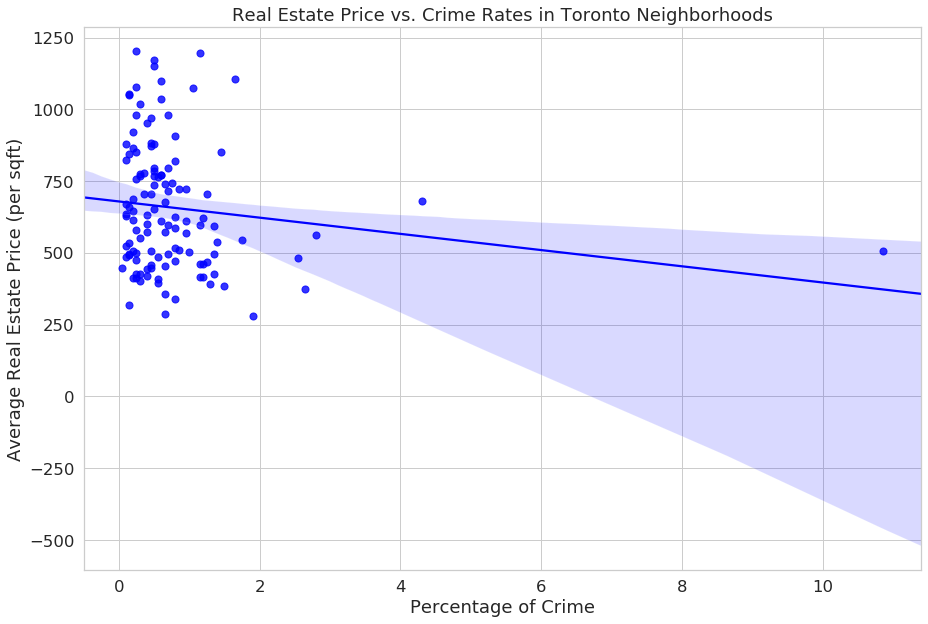

In [29]:
# Plot the graph of price per sqft against crime rate.

plt.figure(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='Average', y='ppsqft', data=price_vs_crime, color='blue', marker='.', scatter_kws={'s': 200})
ax.set(xlabel='Percentage of Crime', ylabel='Average Real Estate Price (per sqft)')
ax.set_title('Real Estate Price vs. Crime Rates in Toronto Neighborhoods')

price_vs_crime[['ppsqft','Average']].corr()

This regression plot shows that crime rates in a neighborhood do not significantly affect real-estate prices. 

Nevertheless, this information concerns safety and may make or break a buyer's decision to purchase a home in a particular neighborhood.

## Fire Safety

This gives an overview of fire incidents in the GTA in 2019.

In [30]:
# Load the data on Toronto Fire Incidents obtained from Kaggle. Courtesy of Aria (https://www.kaggle.com/phyxle/toronto-fire-incidents)
# Use a subset of incidents (primarily 2019) for this analysis.

firedata = pd.read_csv(r'Fire Incidents Data.csv')
firedata = firedata[['Final_Incident_Type','Extent_Of_Fire','Fire_Alarm_System_Impact_on_Evacuation','Fire_Alarm_System_Operation','Fire_Alarm_System_Presence','Latitude','Longitude']]
firedata.dropna(axis=0, inplace=True)
firedata = firedata.iloc[-1001:-1,:]
firedata.reset_index(drop=True, inplace=True)
firedata.head()

,Final_Incident_Type,Extent_Of_Fire,Fire_Alarm_System_Impact_on_Evacuation,Fire_Alarm_System_Operation,Fire_Alarm_System_Presence,Latitude,Longitude
0,01 - Fire,2 - Confined to part of room/area of origin,1 - All persons (at risk of injury) evacuated ...,1 - Fire alarm system operated,1 - Fire alarm system present,43.64853,-79.34504
1,01 - Fire,1 - Confined to object of origin,3 - No one (at risk) evacuated as a result of ...,1 - Fire alarm system operated,1 - Fire alarm system present,43.74848,-79.28521
2,01 - Fire,2 - Confined to part of room/area of origin,2 - Some persons (at risk) evacuated as a resu...,1 - Fire alarm system operated,1 - Fire alarm system present,43.63873,-79.43661
3,01 - Fire,2 - Confined to part of room/area of origin,1 - All persons (at risk of injury) evacuated ...,1 - Fire alarm system operated,9 - Undetermined,43.71225,-79.46675
4,01 - Fire,1 - Confined to object of origin,1 - All persons (at risk of injury) evacuated ...,1 - Fire alarm system operated,1 - Fire alarm system present,43.81600,-79.20313


In [31]:
# Plot a HeatMap onto the original plot of real-estate prices.

toronto_map = folium.Map(location=[43.7032, -79.3832], zoom_start=12)

toronto_map.choropleth(
    geo_data=tor_geo,
    data=redata,
    columns=['cdc', 'ppsqft'],
    key_on='feature.properties.AREA_NAME',
    fill_color='PuBu', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Real Estate Prices per SqFt in Greater Toronto Area'
)

houses = plugins.MarkerCluster().add_to(toronto_map)
for lat, lng, bed, bath, sqft, typ, price in zip(redata.lat, redata.long, redata.beds, redata.baths, redata.sqft, redata.type, redata.final_price):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup= (str(bed)+' Bed, '+str(bath)+' Bath, '+str(sqft)+'sqft '+str(typ)+': '+str(price))
    ).add_to(houses)

firedata = firedata[['Latitude', 'Longitude']]
heat_data = [[row['Latitude'],row['Longitude']] for index, row in firedata.iterrows()]

# Plot it on the map
HeatMap(heat_data, name='Fire Heat Map in Greater Toronto Area', radius=12, min_opacity=1).add_to(toronto_map)

# Display the map
toronto_map

The HeatMap displays the prevalence of fire incidents in each neighborhood. This can alert buyers to the possibility of fire damage at or near a property they are considering. It also encourages them to ensure that fire safety systems are in place and operational. 

## Price Modeling

This aims to produce a price calculator that buyers can use to accurately estimate the price of a home of their dreams.

The real-estate data is fitted and evaluated to select the optimal model. The considerations analyzed above were used in the modeling, namely: No. of Beds, No. of Baths, Floor Area in SqFt, Parking Availability, Mean District Income and Distance from City-Center.

In [32]:
# Select the desired features from the dataset. Then split it into train/test data to evaluate each model realistically.

features =['baths','sqft','parking','mean_district_income','beds','distcc']    
X = redata[features]
Y = redata['final_price']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

In [33]:
# Test the Multiple Linear Regression model.

lm = LinearRegression()
lm.fit(x_train,y_train)
Yhat_mlr = lm.predict(x_test)
print('R-Score: '+ str(lm.score(x_test,y_test)))
print('MSE: '+ str(mean_squared_error(y_test, Yhat_mlr)))

R-Score: 0.6874211449039651
MSE: 65741454944.68865


In [34]:
# Test the Pipe method with the Linear Regression model.

Input=[('scale',StandardScaler()),('polynomial', PolynomialFeatures(include_bias=False)),('model',LinearRegression())]
pipe=Pipeline(Input)
pipe.fit(x_train,y_train)
Yhat_pipe = pipe.predict(x_test)
print('R-Score: '+ str(pipe.score(x_test,y_test)))
print('MSE: '+ str(mean_squared_error(y_test, Yhat_pipe)))

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/base.py:465: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, y, **fit_params).transform(X)


R-Score: 0.762792381976483
MSE: 49889407676.148895


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/pipeline.py:331: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


In [35]:
# Test the Ridge Regression method.

RidgeModel = Ridge(alpha=0.1)
RidgeModel.fit(x_train,y_train)
Yhat_ridge = RidgeModel.predict(x_test)
print('R-Score: '+ str(RidgeModel.score(x_test,y_test)))
print('MSE: '+ str(mean_squared_error(y_test, Yhat_ridge)))

R-Score: 0.6874171735715379
MSE: 65742290193.6749


In [36]:
# Test the Polynomial Regression with Ridge Regression model.

pr=PolynomialFeatures(degree=2, include_bias=False)
x_train_pr = pr.fit_transform(x_train)
x_test_pr = pr.fit_transform(x_test)
RidgeModelPR = Ridge(alpha=0.1)
RidgeModelPR.fit(x_train_pr,y_train)
Yhat_ridgepr = RidgeModelPR.predict(x_test_pr)
print('R-Score: '+ str(RidgeModelPR.score(x_test_pr,y_test)))
print('MSE: '+ str(mean_squared_error(y_test, Yhat_ridgepr)))

R-Score: 0.7628041402674306
MSE: 49886934677.28173


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=2.13917e-22): result may not be accurate.
  overwrite_a=True).T


Based on the above tests, it can be observed that **Polynomial Regression (degree=2) with Ridge Regression model** produces the best results **(R-Score of 0.839, MSE of 3.08 x 10^10)**.

To further confirm the viability of this model, we can train it using the current dataset and test it on completely new data. Recall that the current dataset is a slice of the original dataset that was very large. Therefore, we can slice out a different section of this dataset for an 'out-of-sample testing'. This will help to simulate the real-world performance of our model even better.

In [37]:
# Test the Polynomial Regression with the Ridge Regression method using data from outside the original dataset.

Xtest = retest[features]
Ytest = retest['final_price']
X_pr = pr.fit_transform(X)
Xtest_pr = pr.fit_transform(Xtest)
RidgeModelPR = Ridge(alpha=0.1)
RidgeModelPR.fit(X_pr,Y)
Yhat = RidgeModelPR.predict(Xtest_pr)
print('R-Score: '+ str(RidgeModelPR.score(Xtest_pr,Ytest)))
print('MSE: '+ str(mean_squared_error(Ytest, Yhat)))

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=2.17587e-22): result may not be accurate.
  overwrite_a=True).T


R-Score: 0.8293878138577535
MSE: 42722757052.27056


As shown by the new R-Score and MSE, the model performs even better on real-world data.

Let us visualize this on a graph.

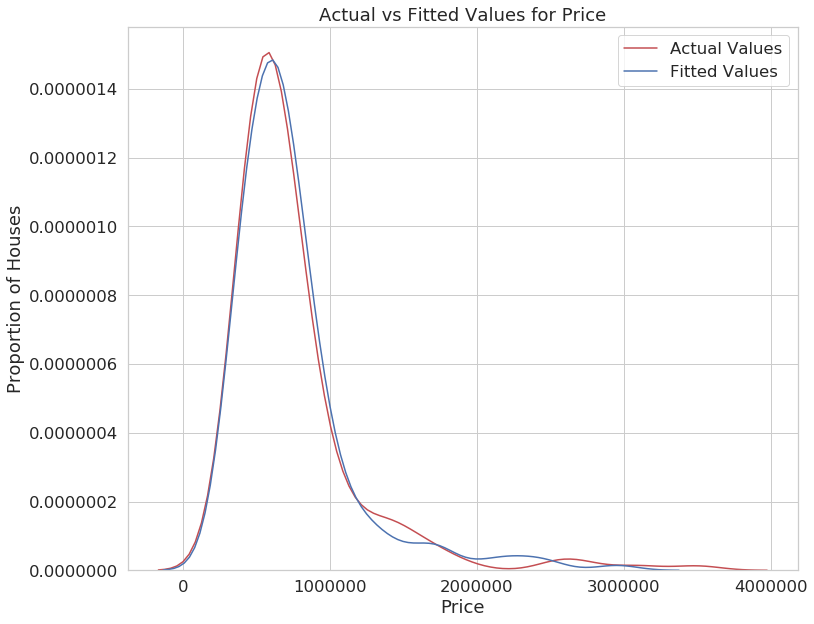

In [38]:
plt.figure(figsize=(12, 10))

ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Values")
sns.distplot(Yhat_ridgepr, hist=False, color="b", label="Fitted Values" , ax=ax1)

plt.title('Actual vs Fitted Values for Price')
plt.xlabel('Price')
plt.ylabel('Proportion of Houses')

plt.show()

The fitted and actual values are very close together up till a price range of about 1,200,000 with slight divergence at the 600,000 region. They are still reasonably close thereafter. This is a good fit.

**Therefore, our model can be considered reliable for use in our calculator!**

## Price Calculator

The calculator will utilize Buyers' input on the No. of Beds, No. of Baths, Floor Area in SqFt, Parking Availability, Mean District Income and Distance from City-Center to generate a predicted price.

In [39]:
# Design the calculator to take in user input on the previously examined conditions and output a estimated price.

new_input = pd.DataFrame(columns=['baths','sqft','parking','mean_district_income','beds','distcc'])
beds=[]
baths=[]
sqft=[]
parking=[]
mdi=[]
distcc=[]

beds.insert(0, str(input('Type the number of bedrooms:\n')))
baths.insert(0, str(input('Type the number of bathrooms (add 0.5 for half-bathrooms):\n')))
sqft.insert(0, str(input('Type the floor area in sqft (only digits):\n')))
parking.insert(0, str(input('Parking (1 for yes, 0 for no):\n')))
mdi.insert(0, str(input('Type the mean annual income of families in the district (only digits):\n')))
distcc.insert(0, str(input('Type the distance from the city-center in km (only digits):\n')))

new_input['baths']=baths
new_input['beds']=beds
new_input['sqft']=sqft
new_input['parking']=parking
new_input['mean_district_income']=mdi
new_input['distcc']=distcc

x_train_pr = pr.fit_transform(x_train)
new_input_pr = pr.fit_transform(new_input)
RidgeModelPR = Ridge(alpha=0.1)
RidgeModelPR.fit(x_train_pr,y_train)
Yhat = RidgeModelPR.predict(new_input_pr)

print('The estimated price for your selection is ${:10,}!'.format(int(Yhat[0].round())))

Type the number of bedrooms:
 3
Type the number of bathrooms (add 0.5 for half-bathrooms):
 2
Type the floor area in sqft (only digits):
 1300
Parking (1 for yes, 0 for no):
 1
Type the mean annual income of families in the district (only digits):
 100000
Type the distance from the city-center in km (only digits):
 5


The estimated price for your selection is $ 1,104,845!


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=2.13917e-22): result may not be accurate.
  overwrite_a=True).T
